In [1]:
import numpy as np
import pandas as pd
import pickle
import oenotebook as oenb
import matplotlib.pyplot as plt
from openeye.oechem import *
from openmoltools.openeye import *
from openeye.oeiupac import *

%matplotlib inline

In [2]:
#Import Relevant files
data = pickle.load(open('output/IDAC_FINAL.pkl', 'rb'))
data = data.reset_index(drop = True)
data['Temp'] = [float(x) for x in data['Temp']]
log_IDAC_expt = [np.log(float(x)) for x in data['IDAC_expt']]
log_IDAC_calc = [np.log(float(x)) for x in data['IDAC_calc']]

FE_expt = []
FE_calc = []
k = 0.0019872041
for i in range(len(data)):
    temp = data.iloc[i].Temp
    FE_expt.append(k*temp*log_IDAC_expt[i])
    FE_calc.append(k*temp*log_IDAC_calc[i])

data['kT*ln(IDAC_expt)'] = FE_expt
data['kT*ln(IDAC_calc)'] = FE_calc

cols = data.columns.tolist()
cols = cols[:4] +[cols[-1]] +[cols[4]] +[cols[-2]] +[cols[5]]
data = data[cols]

data.head()

,Name,Temp,IDAC_calc,IDAC_expt,kT*ln(IDAC_calc),kT*ln(IDAC_calc)_Error,kT*ln(IDAC_expt),kT*ln(IDAC_exp)_Error
0,o-xylene,308.15,2379.94,29850.0,4.760971,0.02,6.309689,0.00000
1,tetrahydrofuran,338.05,42.33,9.4,2.516128,0.02,1.505251,0.00005
2,hexan-2-one,298.15,228.78,355.7,3.218829,0.03,3.480308,0.00000
3,2-[2-(2-hydroxyethoxy)ethoxy]ethanol,378.15,2.94,0.807,0.810383,0.20,-0.161137,0.00000
4,butan-1-amine,293.15,7.58,4.0,1.179960,0.02,0.807584,0.00000


In [3]:
smiles = {}
for name in data.Name.unique():
    mol_from_name = OEMol()
    OEParseIUPACName(mol_from_name, name)
    smiles[name] = OECreateCanSmiString(mol_from_name)

In [4]:
data['SMILES'] = [smiles[name] for name in data.Name]
data['Molecule'] = [smiles_to_oemol(x) for x in data.SMILES]

mols = []
for i in range(len(data)):
    mol = data.Molecule.unique()[i]
    OETriposAtomNames(mol)
    mol = normalize_molecule(mol)
    mol = generate_conformers(mol, max_confs=1, strictStereo=False, strictTypes=False)
    for j, conf in enumerate(mol.GetConfs()):
        if j > 0:
            mol.DeleteConf(conf)
    mols.append(mol)
data['Molecule'] = mols

In [5]:
cols = data.columns.tolist()
cols = [cols[-1]] + cols[:-1]
data = data[cols]

,Molecule,Name,Temp,IDAC_calc,IDAC_expt,kT*ln(IDAC_calc),kT*ln(IDAC_calc)_Error,kT*ln(IDAC_expt),kT*ln(IDAC_exp)_Error,SMILES
0,,o-xylene,308.15,2379.94,29850.0,4.760971,0.02,6.309689,0.00000,Cc1ccccc1C
1,,tetrahydrofuran,338.05,42.33,9.4,2.516128,0.02,1.505251,0.00005,C1CCOC1
2,,hexan-2-one,298.15,228.78,355.7,3.218829,0.03,3.480308,0.00000,CCCCC(=O)C
3,,2-[2-(2-hydroxyethoxy)ethoxy]ethanol,378.15,2.94,0.807,0.810383,0.20,-0.161137,0.00000,C(COCCOCCO)O
4,,butan-1-amine,293.15,7.58,4.0,1.179960,0.02,0.807584,0.00000,CCCCN

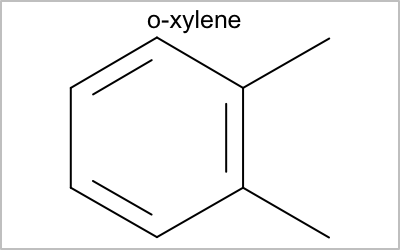
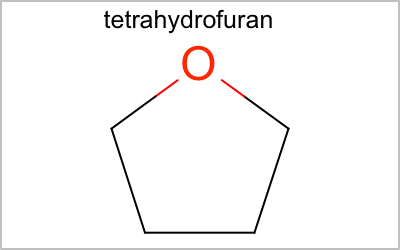
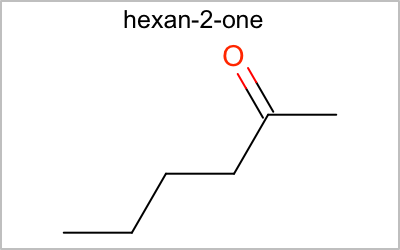
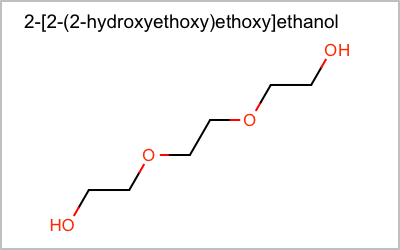
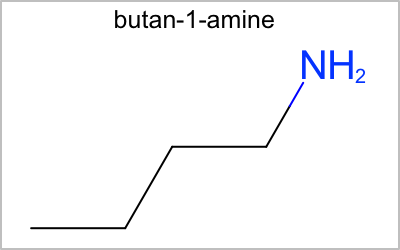

In [6]:
#Can use function oenb.render_dataframe to visualize OEMol object within the dataframe
oenb.render_dataframe(data.head())

In [7]:
data[data.Name == 'prop-1-ene']

,Molecule,Name,Temp,IDAC_calc,IDAC_expt,kT*ln(IDAC_calc),kT*ln(IDAC_calc)_Error,kT*ln(IDAC_expt),kT*ln(IDAC_exp)_Error,SMILES
68,<oechem.OEMol; proxy of <Swig Object of type '...,prop-1-ene,298.15,655.49,1040.0,3.842492,2.51,4.115978,0.0,CC=C


### Adding 2D Depiction Tools

In [8]:
import mpld3
#read_file_to_dataframe
molImgs = list(data.Molecule.apply(lambda x: oenb.draw_mol_to_img_tag(x,300,200)))


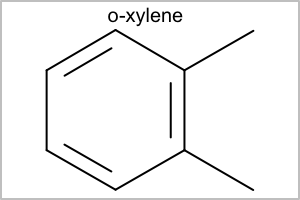

In [9]:
from IPython.display import HTML
HTML(molImgs[0])

In [9]:
exp = np.array(data["kT*ln(IDAC_expt)"])
calc = np.array(data["kT*ln(IDAC_calc)"])
zx = (exp-exp.mean())/(exp.std())
zy = (calc-calc.mean())/(calc.std())
corr = np.sum(zx*zy)/(len(exp))

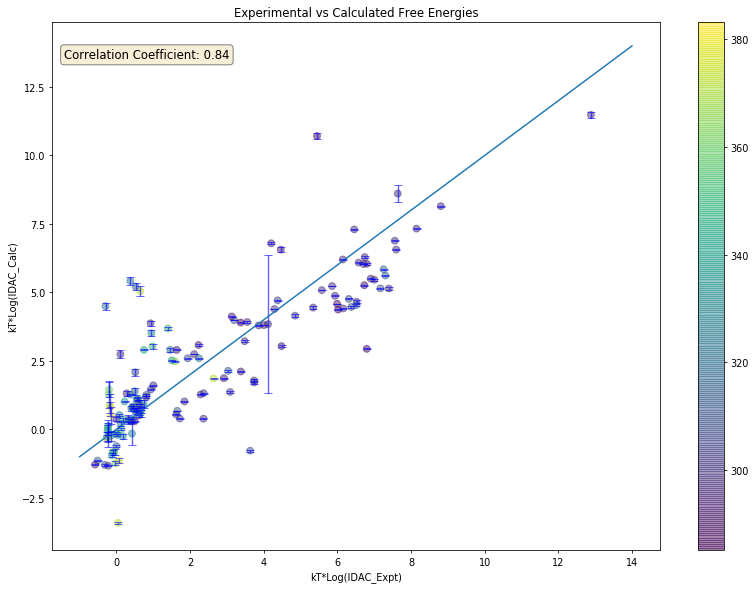

In [11]:
fig = plt.figure(figsize=(14, 10), dpi = 70)
axs = fig.add_subplot(111)
#fig, axs = plt.subplots(figsize = (30,20))
axs.set_xlabel('kT*Log(IDAC_Expt)')
axs.set_ylabel('kT*Log(IDAC_Calc)')
axs.plot([-1,14], [-1,14])
axs.set_title('Experimental vs Calculated Free Energies')
sc = axs.errorbar(data["kT*ln(IDAC_expt)"], data["kT*ln(IDAC_calc)"], data["kT*ln(IDAC_calc)_Error"], fmt = '.k',
            ecolor = 'blue', alpha = 0.6, markersize=0, capsize = 4)
sc = plt.scatter(data["kT*ln(IDAC_expt)"], data["kT*ln(IDAC_calc)"], s = 50, c = data['Temp'], alpha = 0.5 )

# place a text box in upper left in axes coords
textstr = 'Correlation Coefficient: {:.2f}'.format(corr)
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

axs.text(0.02, 0.95, textstr, transform=axs.transAxes, fontsize=12,
        verticalalignment='top', bbox=props)
plt.colorbar(sc)
plt.show()


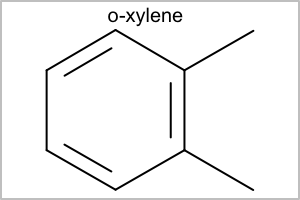
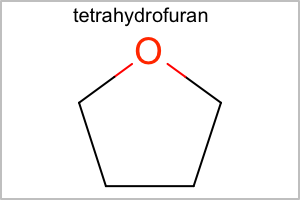
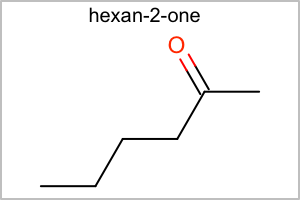
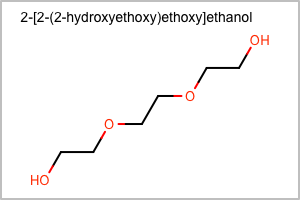
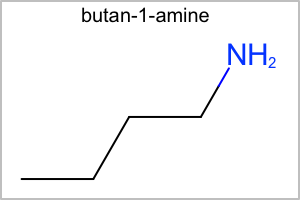
...
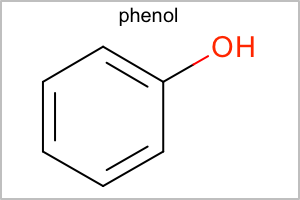
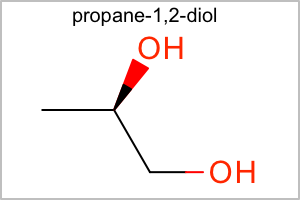
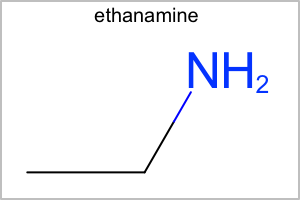
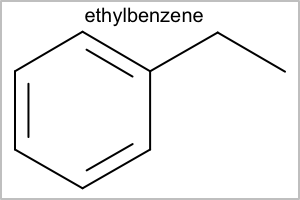
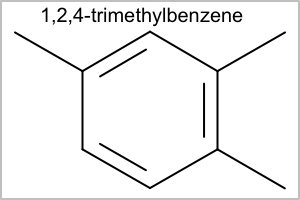

In [12]:
#Create HTML plugin
tooltip = mpld3.plugins.PointHTMLTooltip(sc, molImgs)

#Connect plugin to figure
mpld3.plugins.connect(fig, tooltip)
mpld3.display(fig = fig)

In [18]:
#Drop outlier (dodecane) to get adjusted correlation coefficient
adj = data[data['Name'] != 'dodecane']
adj = adj.reset_index(drop = True)

#Adjust molecule images to account for removed entry
data[data['Name'] == 'dodecane']
index = 36
HTML(molImgs[index])
newimgs = molImgs[:36] + molImgs[37:]

In [33]:
exp = np.array(adj["kT*ln(IDAC_expt)"])
calc = np.array(adj["kT*ln(IDAC_calc)"])
zx = (exp-exp.mean())/(exp.std())
zy = (calc-calc.mean())/(calc.std())
corr = np.sum(zx*zy)/(len(exp))

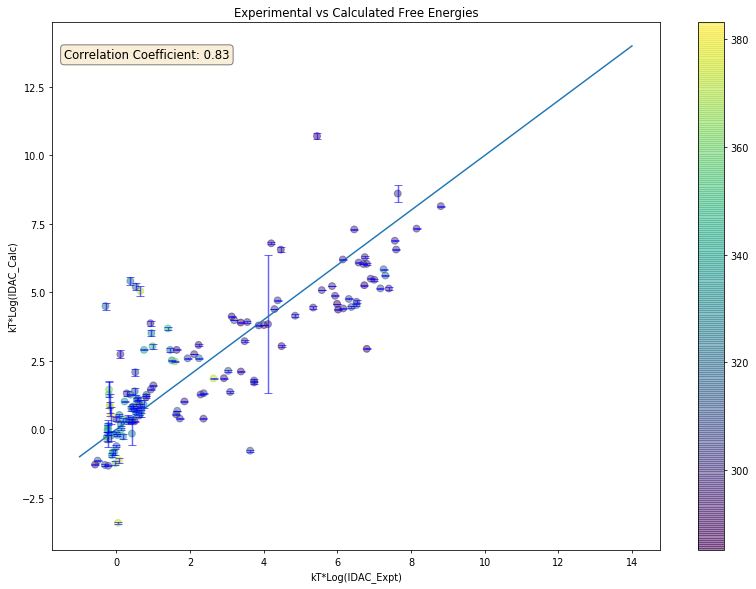

In [34]:
fig = plt.figure(figsize=(14, 10), dpi = 70)
axs = fig.add_subplot(111)
#fig, axs = plt.subplots(figsize = (30,20))
axs.set_xlabel('kT*Log(IDAC_Expt)')
axs.set_ylabel('kT*Log(IDAC_Calc)')
axs.plot([-1,14], [-1,14])
axs.set_title('Experimental vs Calculated Free Energies')
sc2 = axs.errorbar(adj["kT*ln(IDAC_expt)"], adj["kT*ln(IDAC_calc)"], adj["kT*ln(IDAC_calc)_Error"], fmt = '.k',
            ecolor = 'blue', alpha = 0.6, markersize=0, capsize = 4)
sc2 = plt.scatter(adj["kT*ln(IDAC_expt)"], adj["kT*ln(IDAC_calc)"], s = 50, c = adj['Temp'], alpha = 0.5 )

# place a text box in upper left in axes coords
textstr = 'Correlation Coefficient: {:.2f}'.format(corr)
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

axs.text(0.02, 0.95, textstr, transform=axs.transAxes, fontsize=12,
        verticalalignment='top', bbox=props)
plt.colorbar(sc2)
plt.show()


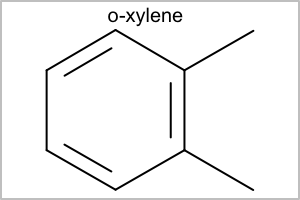
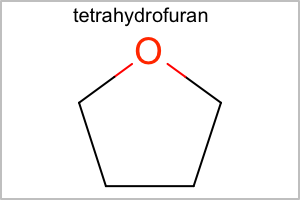
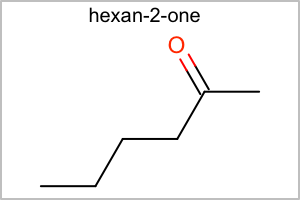
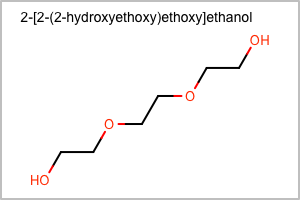
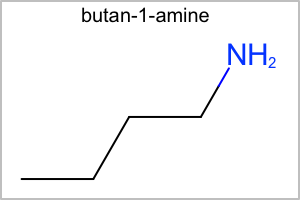
...
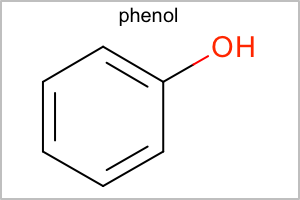
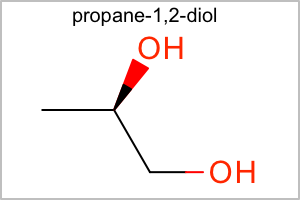
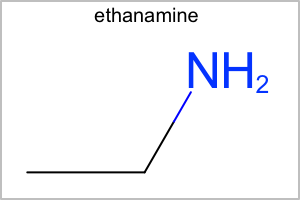
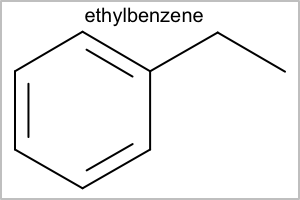
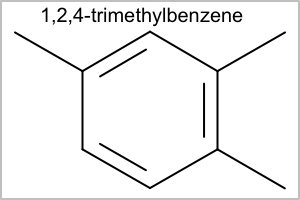

In [35]:
#Create HTML plugin
tooltip = mpld3.plugins.PointHTMLTooltip(sc2, newimgs)

#Connect plugin to figure
mpld3.plugins.connect(fig, tooltip)
mpld3.display(fig = fig)